## 1: Business Understanding
---

### About the dataset

> - This dataset contains informnation about a Portuguese bank marketing campaign. 
- It's goal is to predict if the client will subscribe to a term deposit, indicated by the attribute y
- The attributes are of 3 categories
    1. Client Data
    2. Last contact of the current campaign
    3. Other attributes
    
## 1. Client Data:<br>
<a id="bank_client_data"></a>
1.  `age`: (numeric)<br>
2.  `job`: type of job $\rightarrow$ (categorical: **'admin.'**,**'blue-collar'**,**'entrepreneur'**,**'housemaid'**,**'management'**,**'retired'**,**'self-employed'**,**'services'**,**'student'**,**'technician'**,**'unemployed'**,**'unknown'**)<br>
3.  `marital`: marital status $\rightarrow$ (categorical: **'divorced'**,**'married'**,**'single'**,**'unknown'**; note: 'divorced' means divorced or widowed)<br>
4.  `education`: (categorical: **primary**, **secondary**, **tertiary** and **unknown**)<br>
5.  `default`: has credit in default? $\rightarrow$ (categorical: **'no'**,**'yes'**,**'unknown'**)<br>
6.  `housing`: has housing loan? $\rightarrow$ (categorical: **'no'**,**'yes'**,**'unknown'**)<br>
7.  `loan`: has personal loan? $\rightarrow$ (categorical: **'no'**,**'yes'**,**'unknown'**)<br>
8.  `balance`: Balance of the individual.$\rightarrow$ numeric

---

### 2. (related to) last contact of the current campaign
9. `contact`: contract communication type $\rightarrow$ (categorical: **'cellular'**, **'telephone'**)
10. `month` : last contact month of year $\rightarrow$ (categorical: **'jan'**, **'feb'**, **'mar'**, ..., **'nov'**, **'dec'**)
11. `day` : last contact day of the week $\rightarrow$ (categorical: **'mon'**,**'tue'**,**'wed'**,**'thu'**,**'fri'**)
12. `duration`: last contract duration (in seconds) $\rightarrow$ numeric
---

### 3. Other attributes
13. `campaign`: number of contacts performed during this campaign and for this client  $\rightarrow$ numeric
14. `pdays` :  number of days that passed by after the client was last contacted from a previous campaign $\rightarrow$ numeric (**999** means the client was not previously contacted)
15. - `previous`: number of contacts performed before this campaign and for this client (numeric)
15. `poutcome` : outcomne of the previous marketing campaign (categorical: **'failure'**, **'nonexistent'**, **'success'**)

#### social and economic context attributes
16.  `emp.var.rate`: employment variation rate - quarterly indicator (numeric)
    - More popularly known as cyclical employment variation.Its basically the variation of how many people are being hired or fired due to the shifts in the conditions of the economy
17.  `cons.price.idx`: consumer price index - monthly indicator (numeric)
18.  `cons.conf.idx`: consumer confidence index - monthly indicator (numeric)
19.  `euribor3m`: euribor 3 month rate - daily indicator (numeric)
    - The Euro Interbank Offered Rate (Euribor): a reference rate published by the European Money Market Institute
20.  `nr.employed`: number of employees - quarterly indicator (numeric)


#### Output variable:
21. `y` : has the client subscribed a term deposit? $\rightarrow$ binary: **'yes'**, **'no'**

### 2 : Load and Explore the Data

In [7]:
# imports
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', 500)
from math import ceil
from datetime import datetime

# Visualization
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from pandas_profiling import ProfileReport
import pandas_profiling as pp

In [8]:
bank_df = pd.read_csv('bank-additional-full.csv', sep=';')

In [3]:
# check for null values
print("Is there any null values in the data ? \n", bank_df.isnull().values.any())

Is there any null values in the data ? 
 False


In [4]:
# Anticipate for undetected missing values due to some formatting

# Add formats that may results in undetected missing values
miss_val_formats = ["n.a", "?", "NA", "n/a", "na", "--"]

#read the data again
bank_df = pd.read_csv('bank-additional-full.csv', sep=';', na_values = miss_val_formats)

In [5]:
# check for null values
print("Is there any null values in the data ? \n", bank_df.isnull().values.any())

Is there any null values in the data ? 
 False


In [6]:
# check for duplicated rows
print("Number of duplicated rows: ", bank_df.duplicated().sum())

Number of duplicated rows:  12


In [9]:
# dropping duplicated rows
bank_df = bank_df.drop_duplicates()

# check for duplicated rows
print("Number of duplicated rows: ", bank_df.duplicated().sum())

Number of duplicated rows:  0


In [8]:
# View statistical properties of the numerical data
print('Discrption of Numerical Data : ')
bank_df.describe()

Discrption of Numerical Data : 


,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41176.00000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000
mean,40.02380,258.315815,2.567879,962.464810,0.173013,0.081922,93.575720,-40.502863,3.621293,5167.034870
std,10.42068,259.305321,2.770318,186.937102,0.494964,1.570883,0.578839,4.627860,1.734437,72.251364
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [9]:
print('Discrption of Object Data : ')
bank_df.describe(include='object')

Discrption of Object Data : 


,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,y
count,41176,41176,41176,41176,41176,41176,41176,41176,41176,41176,41176
unique,12,4,8,3,3,3,2,10,5,3,2
top,admin.,married,university.degree,no,yes,no,cellular,may,thu,nonexistent,no
freq,10419,24921,12164,32577,21571,33938,26135,13767,8618,35551,36537


### 3: Exploratory Data Analysis

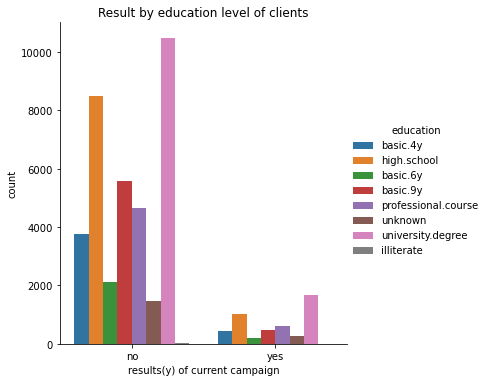

In [10]:
# exploring job type vs current campaign result/outcome
sns.catplot(x="y", hue="education", kind="count", data = bank_df)
plt.title ('Result by education level of clients')
plt.xlabel("results(y) of current campaign")
plt.show ()

In [25]:
bank_df["education"].value_counts(normalize=True)

university.degree      0.295415
high.school            0.231008
basic.9y               0.146809
professional.course    0.127259
basic.4y               0.101418
basic.6y               0.055639
unknown                0.042015
illiterate             0.000437
Name: education, dtype: float64

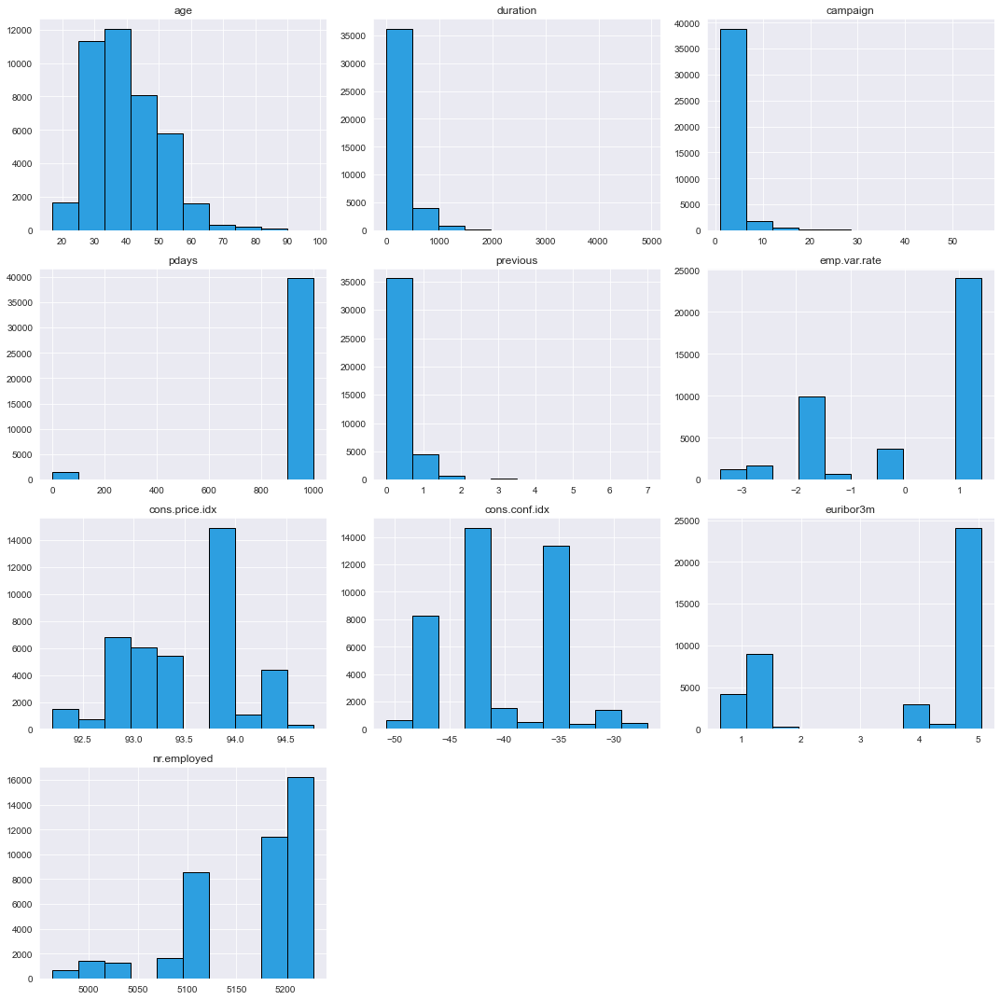

In [48]:
bank_df.hist(figsize=(15,15),edgecolor='k', color='#2d9fe0')
plt.tight_layout()
plt.title ('Numerical Features Distribution')
plt.show()

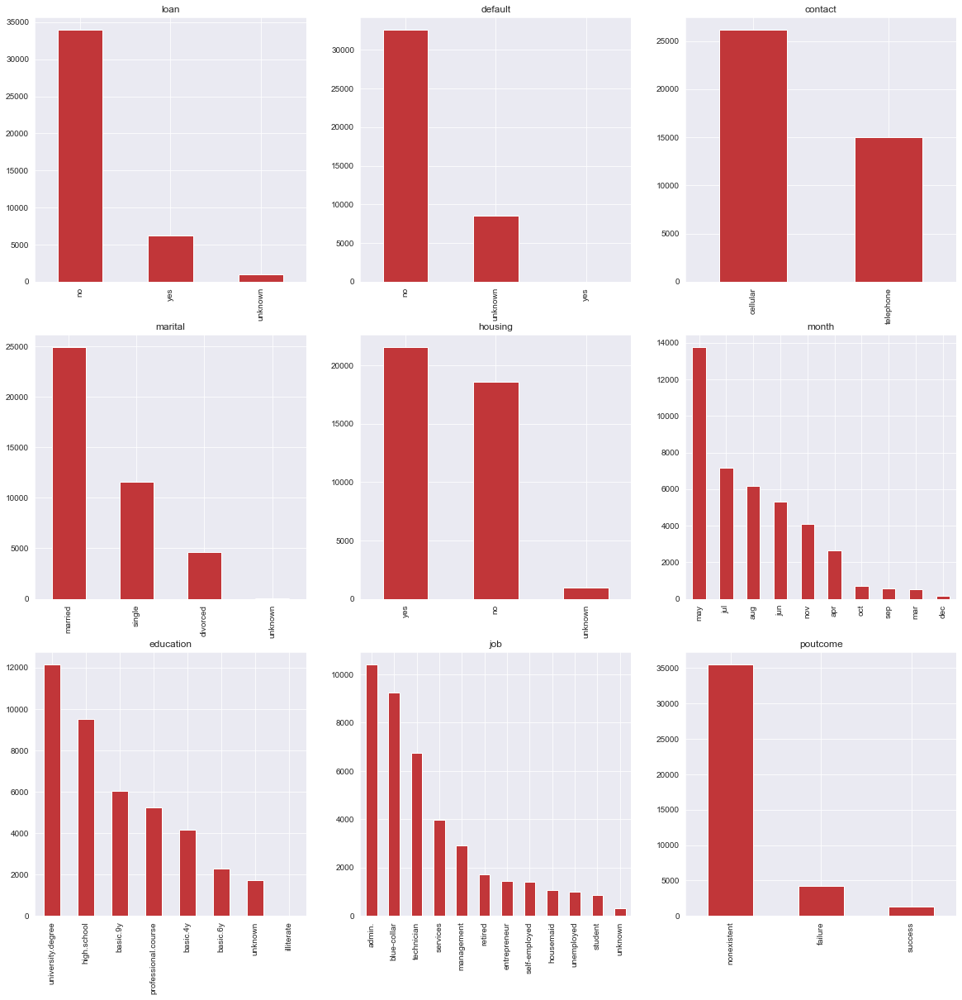

In [90]:
# using bar chart
column_categories = ['loan', 'marital', 'education', 'default', 'housing', 
                     'job', 'contact', 'month', 'poutcome']

# set up the frame for plots
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20,20))

# assigning plots of defined categories into the subplots frame
for i, col in enumerate(column_categories):
    row_index = (i % 3) 
    col_index = int(i / 3)
    fig.add_subplot(bank_df[col].value_counts().plot.bar(ax=axes[row_index, col_index], title=col))

Text(0.5, 1.0, 'Education Level')

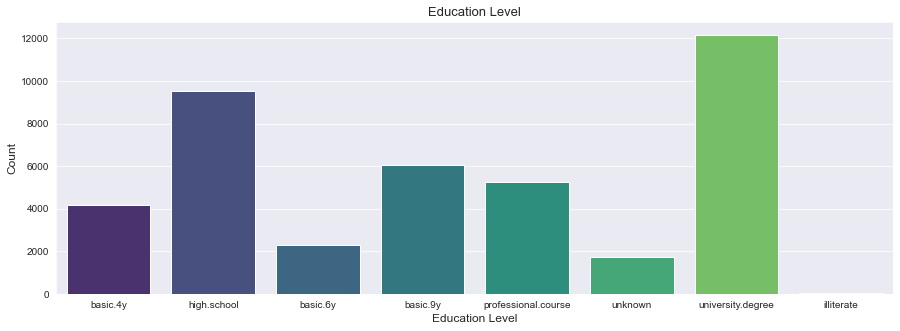

In [69]:
fig, ax = plt.subplots()
fig.set_size_inches(15,5)
sns.countplot(x = "education", data = bank_df, palette='viridis')
ax.set_xlabel('Education Level', fontsize = 12)
ax.set_ylabel('Count', fontsize = 12)
ax.set_title("Education Level", fontsize = 13)

Text(0.5, 1.0, 'Type of Jobs')

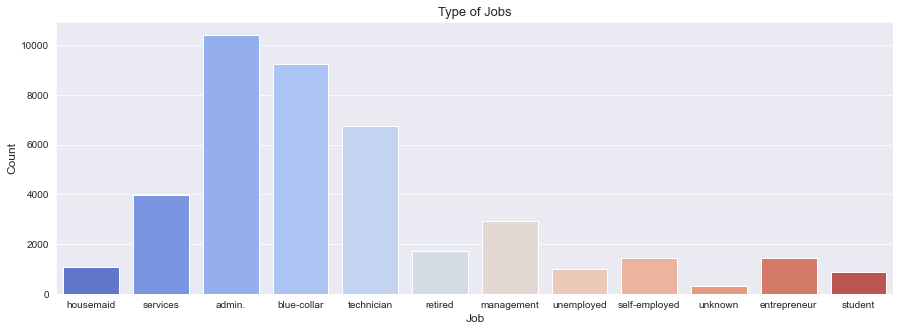

In [62]:
fig, ax = plt.subplots()
fig.set_size_inches(15,5)
sns.countplot(x = "job", data = bank_df, palette='coolwarm')
ax.set_xlabel('Job', fontsize = 12)
ax.set_ylabel('Count', fontsize = 12)
ax.set_title("Type of Jobs", fontsize = 13)

C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


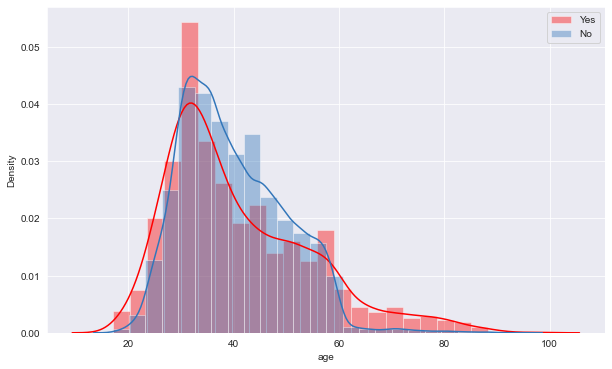

In [89]:
age_target_yes = bank_df[(bank_df['age'] > 0) & (bank_df['y'] == 'yes')]
age_target_no = bank_df[(bank_df['age'] > 0) & (bank_df['y'] == 'no')]

plt.figure(figsize=(10, 6))
sns.distplot(age_target_yes['age'], bins=25, color='r', label='Yes')
sns.distplot(age_target_no['age'], bins=25, color='#3276ba', label='No')
plt.legend()
plt.show()

C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


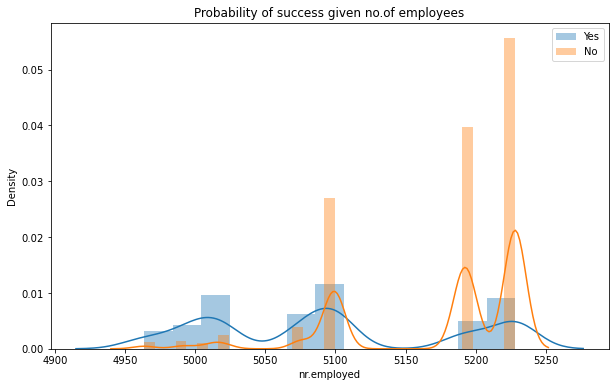

In [31]:
plt.figure(figsize=(10, 6))
g = sns.distplot(bank_df[bank_df['y'] == 'yes']['nr.employed'], label='Yes')
g= sns.distplot(bank_df[bank_df['y'] == 'no']['nr.employed'], label='No')
g.legend()
plt.title ('Probability of success given no.of employees')
plt.show()

C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


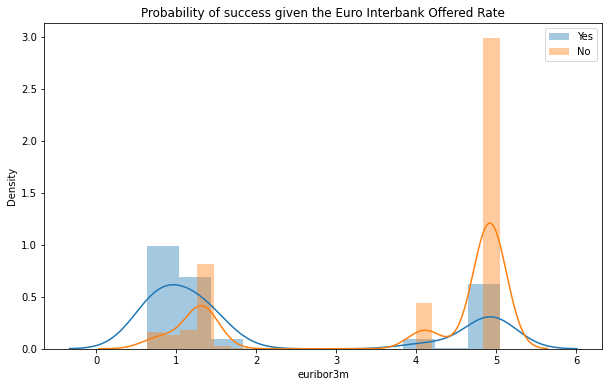

In [32]:
plt.figure(figsize=(10, 6))
g = sns.distplot(bank_df[bank_df['y'] == 'yes']['euribor3m'], label='Yes')
g= sns.distplot(bank_df[bank_df['y'] == 'no']['euribor3m'], label='No')
g.legend()
plt.title ('Probability of success given the Euro Interbank Offered Rate')
plt.show()

C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


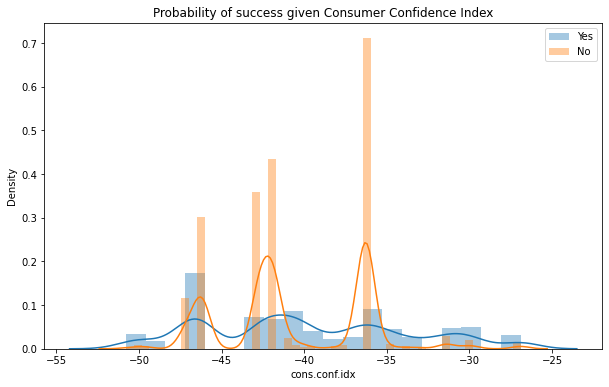

In [33]:
plt.figure(figsize=(10, 6))
g = sns.distplot(bank_df[bank_df['y'] == 'yes']['cons.conf.idx'], label='Yes')
g= sns.distplot(bank_df[bank_df['y'] == 'no']['cons.conf.idx'], label='No')
g.legend()
plt.title ('Probability of success given Consumer Confidence Index')
plt.show()

C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


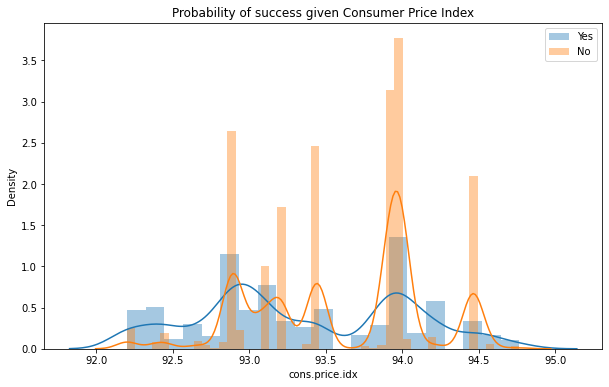

In [37]:
plt.figure(figsize=(10, 6))
g = sns.distplot(bank_df[bank_df['y'] == 'yes']['cons.price.idx'], label='Yes')
g= sns.distplot(bank_df[bank_df['y'] == 'no']['cons.price.idx'], label='No')
g.legend()
plt.title ('Probability of success given Consumer Price Index')
plt.show()

In [41]:
dfgrouped = bank_df.groupby('y')

def feature_perc(feature, groupby= 'yes'):

  count = dfgrouped.get_group(groupby)[feature].value_counts()
  total_count = bank_df[feature].value_counts()[count.index]

  perc = (count/total_count)*100
  return perc 


def plot_barh(array,incrementer, bias,ax= None, text_color ='blue', palette_style = 'darkgrid',palette_color = 'RdBu'):

  sns.set_style(palette_style)
  sns.set_palette(palette_color)
    
  sns.barplot(x= array, y= array.index, ax=ax)
  #plt.barh(array.index, width = array.values, height = .5)
  plt.yticks(np.arange(len(array)))
  plt.xticks( range(0, round(max(array)) +bias, incrementer ))

  for index, value in enumerate(array.values):
    plt.text(value +.5, index, s= '{:.1f}%'.format(value), color = text_color)

  #plt.show()
  return plt

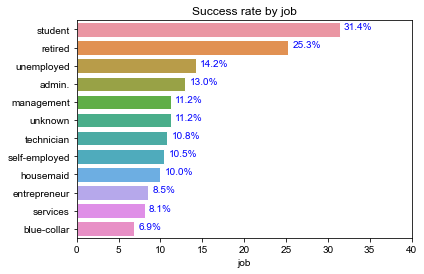

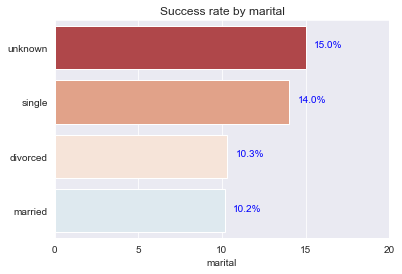

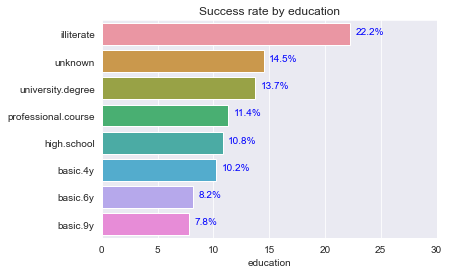

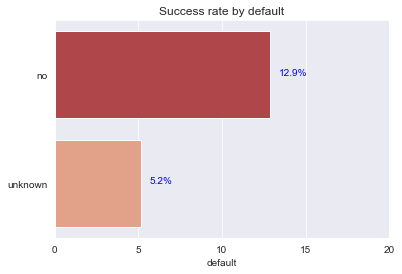

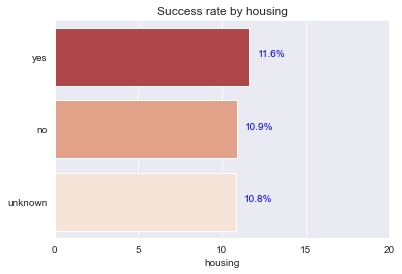

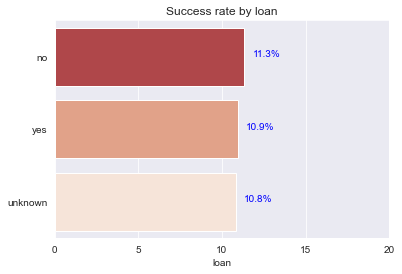

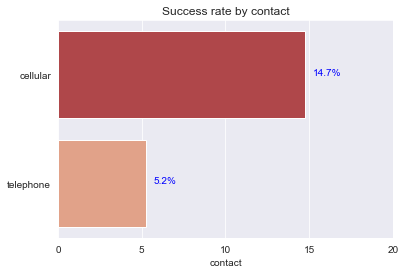

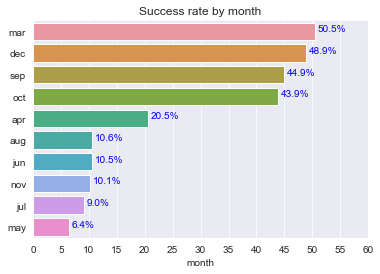

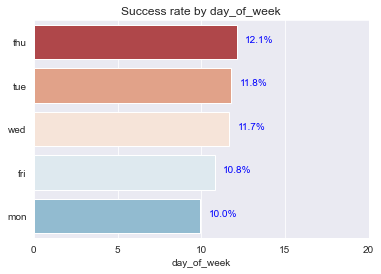

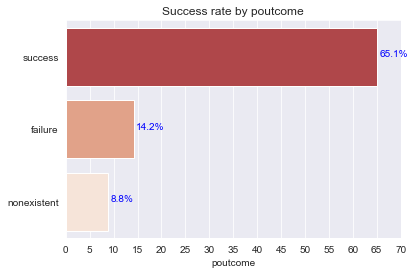

In [42]:
object_features = list(bank_df.dtypes[bank_df.dtypes == 'object'].index)

for feature in object_features[:-1]:
    
    feature_perct =  feature_perc(feature)
    plt.title('Success rate by {}'.format(feature))
    plot_barh(feature_perct.sort_values(ascending= False),5,10, text_color = 'blue')
    plt.show()

In [34]:
cons.price.idx

0   -36.4
1   -36.4
2   -36.4
3   -36.4
4   -36.4
Name: cons.conf.idx, dtype: float64

In [24]:
pp.ProfileReport(bank_df)

In [29]:
profile = pp.ProfileReport(bank_df)
profile.to_file(output_file='Pandas Profiling Report — Bank Marketing Dataset.html')

**Important Highlights from the report: Overview**


- High correlation between variables: `euribor3m`, `emp.var.rate` and `nr.employed` were found to be highly correlated with each other as shown by the pearson's r correlation matrix. **This means we have multicollinearity issue with these attributes**
- `previous` has 35551 (86.3%) zero
    - The Zero of this attribute provide valuable information. Therefore, this column shouldn't be omitted despite the significant number of zeros
- `pdays` : 96.3% of the data belong to `999` value. 
    - `999` indicates there isn't any valuable information (unknown). This column should be dropped

    
**Imbalanced Data**
   - `job` : Most data points 63.2% are belong to admin, blue-collar, and technician. This could be translated as that this data have biases towards these 3 categories of job.
   - `marital`: 60.5% of the data belong to those who married
   - `default`: 79.1% of the data belong to `no`
   - `y` : 88.7% of the data belong to `no`

### 4: Data Preprocessing

In [10]:
# keeping a copy of original data before dropping
bank_df2 = bank_df.copy()

In [4]:
bank_df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [11]:
# dropping duration column
bank_df.drop(['duration'], inplace=True, axis=1)

# dropping pdays column
bank_df.drop(['pdays'], inplace=True, axis=1)

# dropping euribor3m column
bank_df.drop(['euribor3m'], inplace=True, axis=1)

# dropping nr.employed column
bank_df.drop(['nr.employed'], inplace=True, axis=1)

In [93]:
bank_df.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
campaign            int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

In [12]:
# convert categorical variable to numerical labels
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()

categorical_cols = ['job', 'marital', 'education', 'default', 'housing', 
                   'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'y']

for i in categorical_cols:
    bank_df[i] = LE.fit_transform(bank_df[i])
    
bank_df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,y
0,56,3,1,0,0,0,0,1,6,1,1,0,1,1.1,93.994,-36.4,0
1,57,7,1,3,1,0,0,1,6,1,1,0,1,1.1,93.994,-36.4,0
2,37,7,1,3,0,2,0,1,6,1,1,0,1,1.1,93.994,-36.4,0
3,40,0,1,1,0,0,0,1,6,1,1,0,1,1.1,93.994,-36.4,0
4,56,7,1,3,0,0,2,1,6,1,1,0,1,1.1,93.994,-36.4,0


In [13]:
bank_df.dtypes

age                 int64
job                 int32
marital             int32
education           int32
default             int32
housing             int32
loan                int32
contact             int32
month               int32
day_of_week         int32
campaign            int64
previous            int64
poutcome            int32
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
y                   int32
dtype: object

In [15]:
# splitting the data 
X, y = bank_df.iloc[:,:-1], bank_df.iloc[:, 16]

In [16]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2)

In [17]:
# import machine learning library to standardize the data
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
sc.fit_transform(X_train, y_train)
sc.fit(X_test, y_test)

StandardScaler()

**Feature importance: multicollinear features dropped**

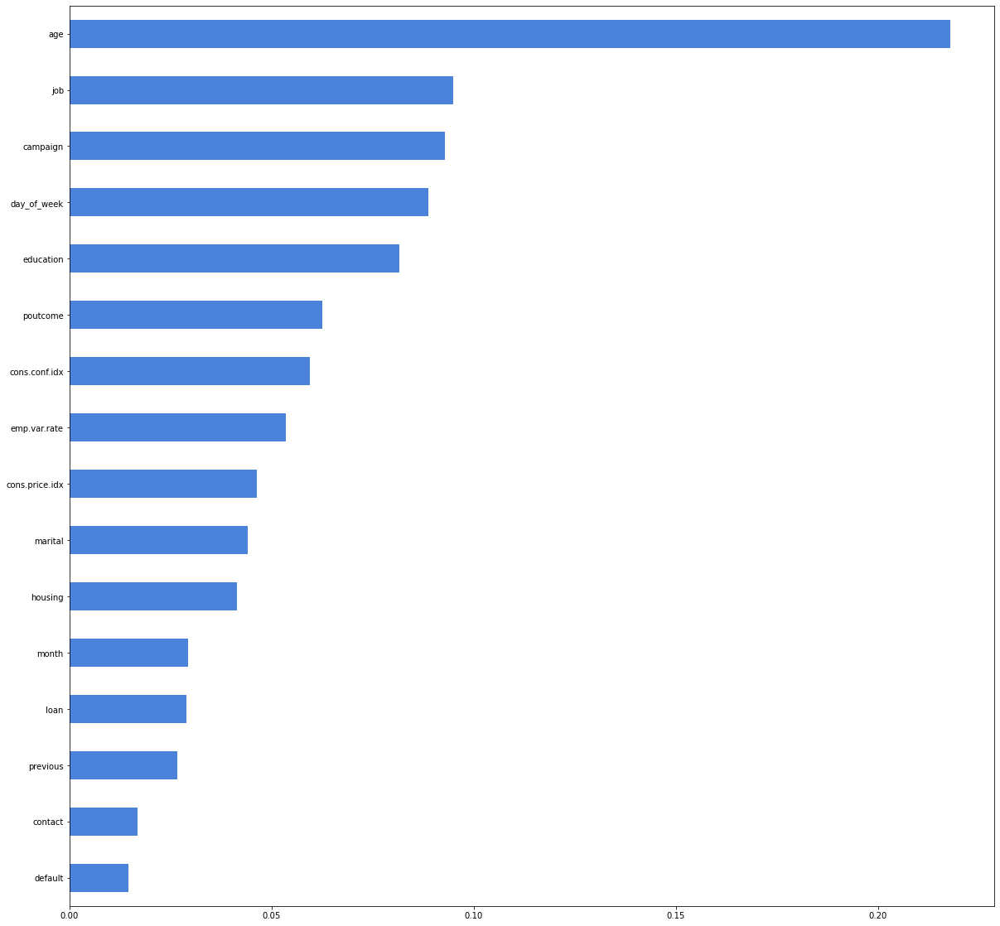

In [18]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()
model.fit(X_train,y_train)

feat_importances = pd.Series(model.feature_importances_, index=X_train.columns)
feat_importances = feat_importances.sort_values(ascending=True)
feat_importances.plot(kind='barh',figsize=(20,20), color='#4a83d9')
plt.show();

Feature: 0, Score: 0.00066
Feature: 1, Score: 0.00043
Feature: 2, Score: 0.00893
Feature: 3, Score: 0.00309
Feature: 4, Score: -0.02340
Feature: 5, Score: -0.00074
Feature: 6, Score: 0.00154
Feature: 7, Score: -0.09506
Feature: 8, Score: -0.00800
Feature: 9, Score: 0.00561
Feature: 10, Score: -0.00200
Feature: 11, Score: 0.07086
Feature: 12, Score: 0.15817
Feature: 13, Score: -0.10491
Feature: 14, Score: 0.18375
Feature: 15, Score: 0.00946


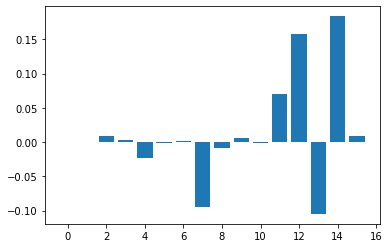

In [19]:
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot

model = LinearRegression()
# fit the model
model.fit(X_train, y_train)
# get importance
importance = model.coef_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

#### Build a pipeline for trying various sampling methods

In [20]:
from sklearn import metrics
from collections import Counter

from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler, NearMiss, TomekLinks, EditedNearestNeighbours

In [21]:
def model_resampling_pipeline(X_train, X_test, y_train, y_test, model):
    results = {'ordinary': {},
               'class_weight': {},
               'oversample': {},
               'undersample': {}}
    
    # ------ No balancing ------
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    accuracy = metrics.accuracy_score(y_test, predictions)
    precision, recall, fscore, support = metrics.precision_recall_fscore_support(y_test, predictions, zero_division=0)
    tn, fp, fn, tp = metrics.confusion_matrix(y_test, predictions).ravel()
    fpr, tpr, thresholds = metrics.roc_curve(y_test, predictions, pos_label=1)
    auc = metrics.auc(fpr, tpr)
    
    results['ordinary'] = {'accuracy': accuracy, 'precision': precision, 'recall': recall, 
                          'fscore': fscore, 'n_occurences': support,
                          'predictions_count': Counter(predictions),
                          'tp': tp, 'tn': tn, 'fp': fp, 'fn': fn,
                          'auc': auc}
    
    
    # ------ Class weight ------
    if 'class_weight' in model.get_params().keys():
        model.set_params(class_weight='balanced')
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        accuracy = metrics.accuracy_score(y_test, predictions)
        precision, recall, fscore, support = metrics.precision_recall_fscore_support(y_test, predictions)
        tn, fp, fn, tp = metrics.confusion_matrix(y_test, predictions).ravel()
        fpr, tpr, thresholds = metrics.roc_curve(y_test, predictions, pos_label=1)
        auc = metrics.auc(fpr, tpr)

        results['class_weight'] = {'accuracy': accuracy, 'precision': precision, 'recall': recall, 
                                  'fscore': fscore, 'n_occurences': support,
                                  'predictions_count': Counter(predictions),
                                  'tp': tp, 'tn': tn, 'fp': fp, 'fn': fn,
                                  'auc': auc}

    
    # ------------ OVERSAMPLING TECHNIQUES ------------
    print('------ Oversampling methods ------')
    techniques = [RandomOverSampler(),
                  SMOTE(),
                  ADASYN()]
    
    for sampler in techniques:
        technique = sampler.__class__.__name__
        print(f'Technique: {technique}')
        print(f'Before resampling: {sorted(Counter(y_train).items())}')
        X_resampled, y_resampled = sampler.fit_sample(X_train, y_train)
        print(f'After resampling: {sorted(Counter(y_resampled).items())}')

        model.fit(X_resampled, y_resampled)
        predictions = model.predict(X_test)
        accuracy = metrics.accuracy_score(y_test, predictions)
        precision, recall, fscore, support = metrics.precision_recall_fscore_support(y_test, predictions)
        tn, fp, fn, tp = metrics.confusion_matrix(y_test, predictions).ravel()
        fpr, tpr, thresholds = metrics.roc_curve(y_test, predictions, pos_label=1)
        auc = metrics.auc(fpr, tpr)

        results['oversample'][technique] = {'accuracy': accuracy, 
                                            'precision': precision, 
                                            'recall': recall,
                                            'fscore': fscore, 
                                            'n_occurences': support,
                                            'predictions_count': Counter(predictions),
                                            'tp': tp, 'tn': tn, 'fp': fp, 'fn': fn,
                                            'auc': auc}

    
    # ------------ UNDERSAMPLING TECHNIQUES ------------
    print('------ Undersampling methods ------')
    techniques = [RandomUnderSampler(),
                  NearMiss(version=1),
                  NearMiss(version=2),
                  TomekLinks(),
                  EditedNearestNeighbours()]
    
    for sampler in techniques:
        technique = sampler.__class__.__name__
        if technique == 'NearMiss': technique+=str(sampler.version)
        print(f'Technique: {technique}')
        print(f'Before resampling: {sorted(Counter(y_train).items())}')
        X_resampled, y_resampled = sampler.fit_sample(X_train, y_train)
        print(f'After resampling: {sorted(Counter(y_resampled).items())}')

        model.fit(X_resampled, y_resampled)
        predictions = model.predict(X_test)
        accuracy = metrics.accuracy_score(y_test, predictions)
        precision, recall, fscore, support = metrics.precision_recall_fscore_support(y_test, predictions)
        tn, fp, fn, tp = metrics.confusion_matrix(y_test, predictions).ravel()
        fpr, tpr, thresholds = metrics.roc_curve(y_test, predictions, pos_label=1)
        auc = metrics.auc(fpr, tpr)

        results['undersample'][technique] = {'accuracy': accuracy, 
                                            'precision': precision, 
                                            'recall': recall,
                                            'fscore': fscore, 
                                            'n_occurences': support,
                                            'predictions_count': Counter(predictions),
                                            'tp': tp, 'tn': tn, 'fp': fp, 'fn': fn,
                                            'auc': auc}
        

    return results

In [22]:
# Visualization tools

def evaluate_method(results, method, metrics = ['precision', 'recall', 'fscore']):
    fig, ax = plt.subplots(1, 7, sharey=True, figsize=(16, 6))
    
    for i, metric in enumerate(metrics):
        ax[i*2].axhline(results['ordinary'][metric][0], label='No Resampling')
        ax[i*2+1].axhline(results['ordinary'][metric][1], label='No Resampling')
        
        if results['class_weight']:
            ax[i*2].bar(0, results['class_weight'][metric][0], label='Adjust Class Weight')
            ax[i*2+1].bar(0, results['class_weight'][metric][1], label='Adjust Class Weight')
            
        ax[0].legend(loc='upper center', bbox_to_anchor=(9, 1.01),
                     ncol=1, fancybox=True, shadow=True)
        
        for j, (technique, result) in enumerate(results[method].items()):
            ax[i*2].bar(j+1, result[metric][0], label=technique)
            
            ax[i*2+1].bar(j+1, result[metric][1], label=technique)
        
        
        ax[i*2].set_title(f'Client Subscribed: \n{metric}')
        ax[i*2+1].set_title(f'Client Rejects: \n{metric}')
    
    # AUC vis
    ax[6].set_title(f'Area under curve')
    ax[6].axhline(results['ordinary']['auc'], label='No Resampling')
    if results['class_weight']:
        ax[6].bar(0, results['class_weight']['auc'], label='Adjust Class Weight')
    for j, (technique, result) in enumerate(results[method].items()):
        ax[6].bar(j+1, result['auc'], label=technique)

### Model Evaluation with multicollinear columns dropped



In [23]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

#### KNN (default, k=5)

In [24]:
model = KNeighborsClassifier()
results = model_resampling_pipeline(X_train, X_test, y_train, y_test, model)

------ Oversampling methods ------
Technique: RandomOverSampler
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 29229), (1, 29229)]
Technique: SMOTE
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 29229), (1, 29229)]
Technique: ADASYN
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 29229), (1, 29987)]
------ Undersampling methods ------
Technique: RandomUnderSampler
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 3711), (1, 3711)]
Technique: NearMiss1
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 3711), (1, 3711)]
Technique: NearMiss2
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 3711), (1, 3711)]
Technique: TomekLinks
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 28217), (1, 3711)]
Technique: EditedNearestNeighbours
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 23197), (1, 3711)]


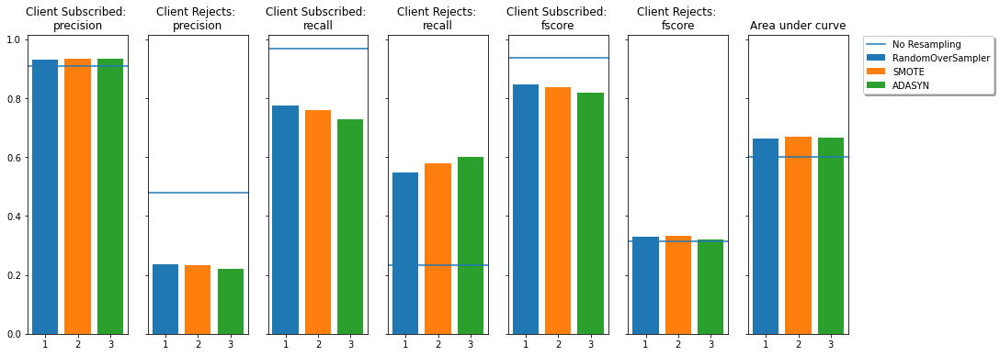

In [25]:
evaluate_method(results, 'oversample')

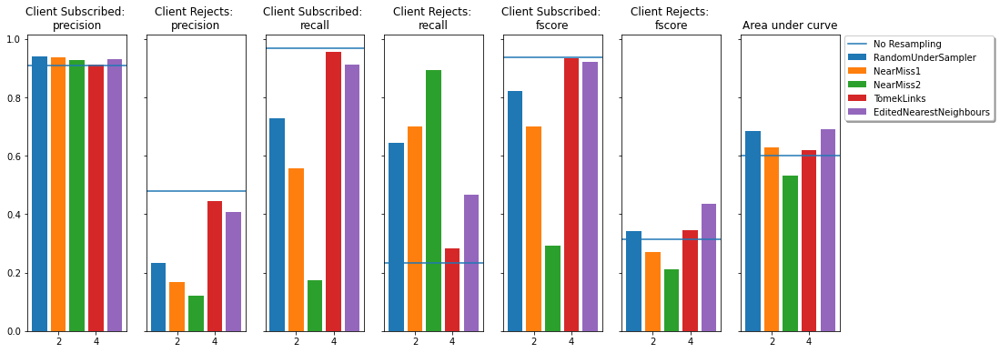

In [26]:
evaluate_method(results, 'undersample')

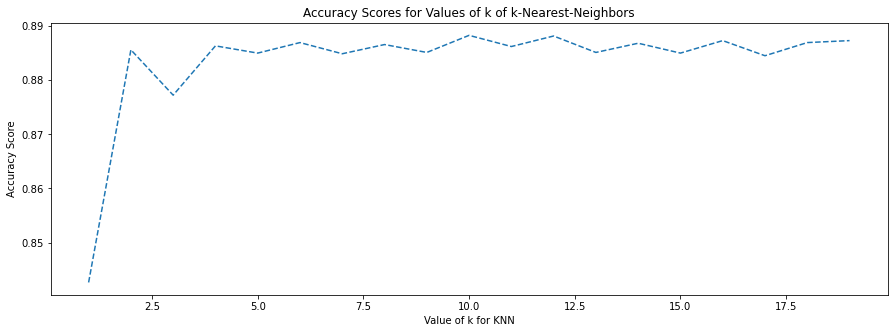

In [27]:
# import KNN model
from sklearn.neighbors import KNeighborsClassifier
# import library for evaluation metrics
from sklearn import metrics

# empty cvariable for storing the KNN metrics
scores = []

# we try different values of k for the KNN (from k=1 until k=26)
lrange=list(range(1,20))

# Loop the KNN process
for k in lrange:
    # input the k value and 'distance' measure
    knn = KNeighborsClassifier(n_neighbors=k)
    
    # input the train data to train KNN
    knn.fit(X_train, y_train)
    
    # see KNN prediction by inputting the test data
    y_pred = knn.predict(X_test)
    
    # append the performance metric (accuracy)
    scores.append(metrics.accuracy_score(y_test, y_pred))
    
plt.figure(2, figsize=(15, 5))

# plot the result
plt.plot(lrange, scores, ls='dashed')
plt.xlabel('Value of k for KNN')
plt.ylabel('Accuracy Score')
plt.title('Accuracy Scores for Values of k of k-Nearest-Neighbors')
plt.show()

#### Looking or best K

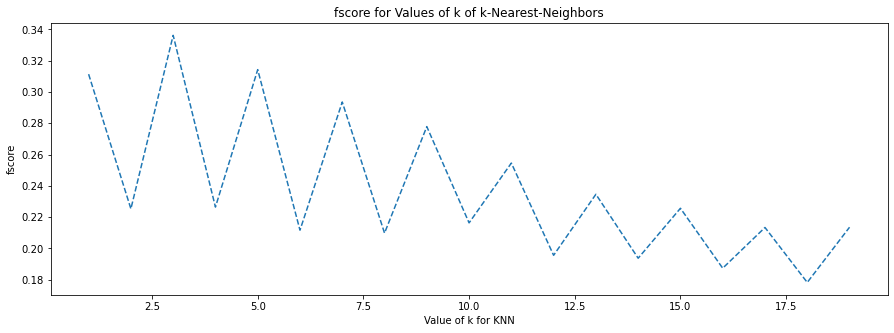

In [28]:
# import KNN model
from sklearn.neighbors import KNeighborsClassifier
# import library for evaluation metrics
from sklearn import metrics

# empty cvariable for storing the KNN metrics
scores = []

# we try different values of k for the KNN (from k=1 until k=26)
lrange=list(range(1,20))

# Loop the KNN process
for k in lrange:
    # input the k value and 'distance' measure
    knn = KNeighborsClassifier(n_neighbors=k)
    
    # input the train data to train KNN
    knn.fit(X_train, y_train)
    
    # see KNN prediction by inputting the test data
    y_pred = knn.predict(X_test)
    
    # append the performance metric (accuracy)
    scores.append(metrics.f1_score(y_test, y_pred))
    
plt.figure(2, figsize=(15, 5))

# plot the result
plt.plot(lrange, scores, ls='dashed')
plt.xlabel('Value of k for KNN')
plt.ylabel('fscore')
plt.title('fscore for Values of k of k-Nearest-Neighbors')
plt.show()

#### KNN (k=3)

In [29]:
model = KNeighborsClassifier(n_neighbors=3)
results = model_resampling_pipeline(X_train, X_test, y_train, y_test, model)

------ Oversampling methods ------
Technique: RandomOverSampler
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 29229), (1, 29229)]
Technique: SMOTE
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 29229), (1, 29229)]
Technique: ADASYN
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 29229), (1, 29987)]
------ Undersampling methods ------
Technique: RandomUnderSampler
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 3711), (1, 3711)]
Technique: NearMiss1
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 3711), (1, 3711)]
Technique: NearMiss2
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 3711), (1, 3711)]
Technique: TomekLinks
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 28217), (1, 3711)]
Technique: EditedNearestNeighbours
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 23197), (1, 3711)]


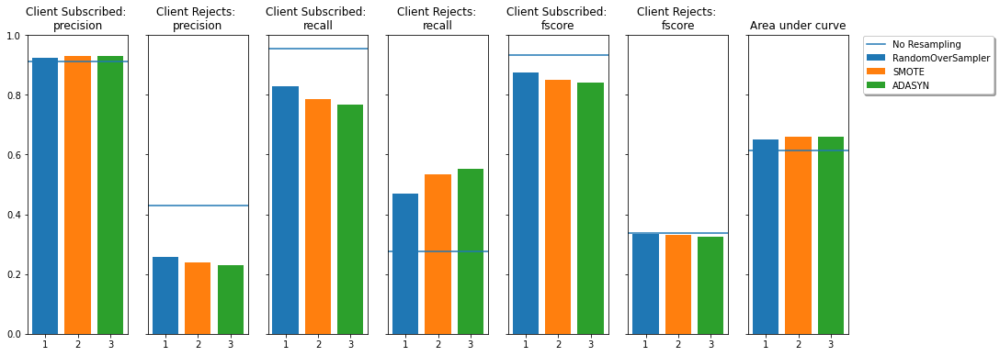

In [30]:
evaluate_method(results, 'oversample')

recall and fscore improved on various sampling scenarios!

### Logistic Regression

In [31]:
model = LogisticRegression()
results = model_resampling_pipeline(X_train, X_test, y_train, y_test, model)

C:\Users\ramdh\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\ramdh\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

------ Oversampling methods ------
Technique: RandomOverSampler
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 29229), (1, 29229)]


C:\Users\ramdh\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Technique: SMOTE
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 29229), (1, 29229)]


C:\Users\ramdh\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Technique: ADASYN
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 29229), (1, 29987)]


C:\Users\ramdh\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\ramdh\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

------ Undersampling methods ------
Technique: RandomUnderSampler
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 3711), (1, 3711)]
Technique: NearMiss1
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 3711), (1, 3711)]
Technique: NearMiss2
Before resampling: [(0, 29229), (1, 3711)]


C:\Users\ramdh\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


After resampling: [(0, 3711), (1, 3711)]


C:\Users\ramdh\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Technique: TomekLinks
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 28217), (1, 3711)]


C:\Users\ramdh\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Technique: EditedNearestNeighbours
Before resampling: [(0, 29229), (1, 3711)]
After resampling: [(0, 23197), (1, 3711)]


C:\Users\ramdh\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


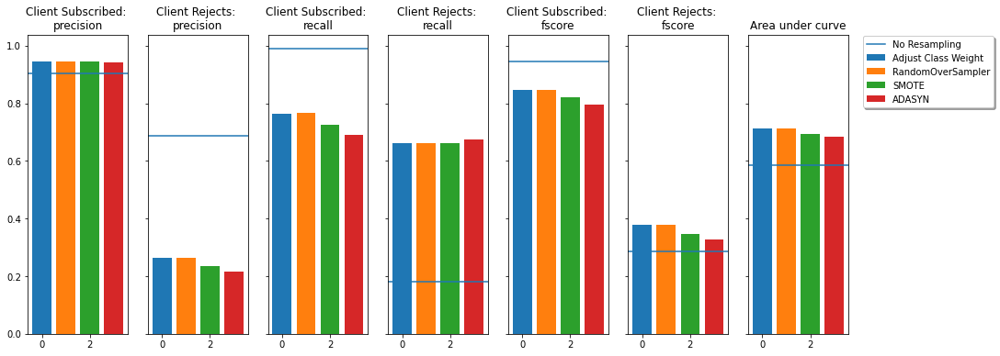

In [32]:
evaluate_method(results, 'oversample')

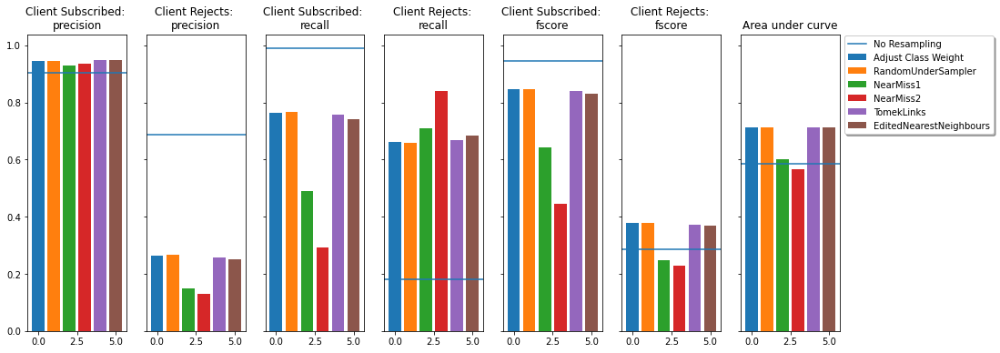

In [33]:
evaluate_method(results, 'undersample')